## **level-2  restaurant rating**





In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
data=pd.read_csv('restaurent.csv')

In [ ]:
data.columns=data.columns.str.strip()

In [ ]:
data.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [ ]:
data[['Aggregate rating','Votes']].isnull().sum()

,0
Aggregate rating,0
Votes,0


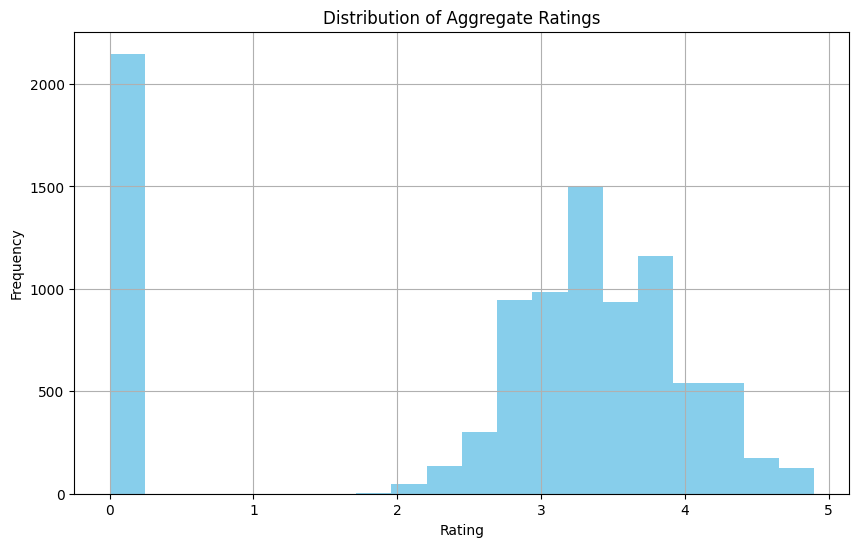

In [ ]:
plt.figure(figsize=(10, 6))
data['Aggregate rating'].hist(bins=20, color='skyblue')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.show()


In [ ]:
common_rating=data["Aggregate rating"].idxmax()
common_rating


3

In [ ]:
average_vote=data["Votes"].idxmax()
average_vote

728

## **average number votes recieved by restaurants**

In [ ]:
data['Votes'].mean()

156.909747670401

## **Cuisine combination**

In [ ]:

cuisine_combinations = data['Cuisines'].str.split(',').explode().str.strip()
common_combinations = cuisine_combinations.value_counts().head(5)
print("Top 10 Common Cuisine Combinations:\n", common_combinations)


Top 10 Common Cuisine Combinations:
 Cuisines
North Indian    3960
Chinese         2735
Fast Food       1986
Mughlai          995
Italian          764
Name: count, dtype: int64


# **Geographic analysis**

In [ ]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster
from sklearn.cluster import DBSCAN
import numpy as np

In [ ]:
data=pd.read_csv('restaurent.csv')

In [ ]:
data[['Longitude', 'Latitude']].isnull().sum()

,0
Longitude,0
Latitude,0


In [ ]:
map = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=12)

In [ ]:
marker_cluster = MarkerCluster().add_to(map)
for idx, row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Rating: {row['Aggregate rating']}"
    ).add_to(marker_cluster)

In [ ]:
map.save('restaurants_map.html')

In [ ]:

map

## **identifying patterns or clusters**

In [ ]:
cord = data[['Latitude', 'Longitude']].values

In [ ]:
DB = DBSCAN(eps=0.01, min_samples=5, metric='haversine').fit(np.radians(cord))
labels = DB.labels_

In [ ]:
data['Cluster'] = labels

In [ ]:
#number of clusters

numbers_of_clusters = len(set(labels)) - (1 if -1 in labels else 0)
numbers_of_clusters



78

In [ ]:
map = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=12)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']

In [ ]:
for idx, row in data.iterrows():
    folium.Marker(
        location=[row['Latitude'], row['Longitude']],
        popup=f"Rating: {row['Aggregate rating']}",
        icon=folium.Icon(color=colors[row['Cluster'] % len(colors)])
    ).add_to(map)

In [ ]:
map.save('restaurants_clusters_map.html')

## **Restaurant chains**

In [ ]:
df = pd.read_csv('restaurent.csv')

restaurant_counts = df['Restaurant Name'].value_counts()
chain_threshold = 3
potential_chains = restaurant_counts[restaurant_counts >= chain_threshold]

# Print the identified chains
print("Potential restaurant chains:")
for chain_name, count in potential_chains.items():
    print(f"{chain_name} ({count} locations)")


Potential restaurant chains:
Cafe Coffee Day (83 locations)
Domino's Pizza (79 locations)
Subway (63 locations)
Green Chick Chop (51 locations)
McDonald's (48 locations)
Keventers (34 locations)
Pizza Hut (30 locations)
Giani (29 locations)
Baskin Robbins (28 locations)
Barbeque Nation (26 locations)
Giani's (22 locations)
Barista (22 locations)
Dunkin' Donuts (22 locations)
Costa Coffee (20 locations)
Pind Balluchi (20 locations)
Wah Ji Wah (19 locations)
Twenty Four Seven (19 locations)
Pizza Hut Delivery (19 locations)
Sagar Ratna (19 locations)
Republic of Chicken (18 locations)
KFC (18 locations)
Starbucks (18 locations)
Chaayos (18 locations)
Burger King (16 locations)
Haldiram's (16 locations)
Shree Rathnam (15 locations)
Frontier (14 locations)
Moti Mahal Delux (14 locations)
Bikanervala (14 locations)
Aggarwal Sweets (14 locations)
Behrouz Biryani (13 locations)
Karim's (13 locations)
Bikaner Sweets (13 locations)
Chicago Pizza (12 locations)
Apni Rasoi (12 locations)
34, Chow

In [ ]:
#Ratting and popularity
average_ratings = df.groupby('Restaurant Name')['Aggregate rating'].mean()
print("\nAverage ratings for potential chains:")
for chain_name, avg_rating in average_ratings.items():
    print(f"{chain_name}: {avg_rating:.2f}")

Streaming output truncated to the last 5000 lines.
Foodicious: 0.00
Foodie: 2.80
Foodie Singh: 0.00
Foodie Xpress: 0.00
Foodieholic: 0.00
Foodies: 0.00
Foodies Joint: 3.40
Foodies Nation: 3.40
Foodies Park: 0.00
Foodiez: 0.00
Foodizm: 0.00
Foodland by Orchid: 2.90
Foodrath: 3.00
Foody Box: 3.10
Foody Dragon: 0.00
Foody Goody: 0.00
For God's Cake: 3.90
For the Love of Cake: 3.80
Foresto Lawn & Restaurant: 0.00
Fork: 4.40
Fork You: 3.80
Fork with Stick: 4.00
Fortune Deli -  Fortune Inn Grazia: 3.20
Fortune Deli - Fortune Select Excalibur: 3.60
Forty 3 East: 3.20
Fouji Da Vaishno Dhaba: 2.90
Four Queens Dairy Cream: 3.90
Fourteen Eleven Tea Cafe: 0.00
Fozzie's Pizzaiolo: 4.30
Frasers: 4.00
Fratini La Trattoria: 4.10
Freakin Beans: 3.70
Free Spirit: 4.30
Freedom Corner: 3.50
Freezy: 0.00
Freito: 3.10
FrenZone: 3.90
French Crust - The Suryaa New Delhi: 3.30
French Omelette: 3.20
French Toast: 4.30
Frequent Bakes: 2.50
Fresc Co: 3.80
Fresh Fast Food: 0.00
Fresh Food: 0.00
Fresh Food Factory: